In [27]:
import matplotlib.pyplot as plt
import arviz as az
import seaborn as sns
from arviz import InferenceData  # ringdown uses arviz InferenceData objects
from pathlib import Path
import ringdown as rd
from ringdown.result import Result
import numpy as np

import re
from io import BytesIO
from PIL import Image

# Single run plots #

In [ ]:
ifos = ['H1', 'L1']
resultpath = 'fitresults/fit_result_modes_2_start_105.nc'
result = Result.from_netcdf(resultpath)

In [3]:
az.summary(result, var_names=['a', 'm', 'chi', 'f', 'g'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"a[b'1,-2,2,2,0']",0.000,0.000,0.000,0.000,0.000,0.000,3047.0,3368.0,1.0
"a[b'1,-2,2,2,1']",0.000,0.000,0.000,0.000,0.000,0.000,2231.0,1212.0,1.0
m,66.565,5.532,56.922,76.101,0.161,0.117,1280.0,1266.0,1.0
chi,0.567,0.126,0.322,0.767,0.003,0.002,1134.0,962.0,1.0
"f[b'1,-2,2,2,0']",237.694,6.529,226.054,250.286,0.121,0.085,2930.0,2481.0,1.0
"f[b'1,-2,2,2,1']",230.311,7.236,217.556,244.663,0.138,0.098,2697.0,2679.0,1.0
"g[b'1,-2,2,2,0']",257.670,29.088,206.175,308.952,0.817,0.578,1273.0,1358.0,1.0
"g[b'1,-2,2,2,1']",781.928,90.633,617.482,937.924,2.544,1.799,1264.0,1357.0,1.0


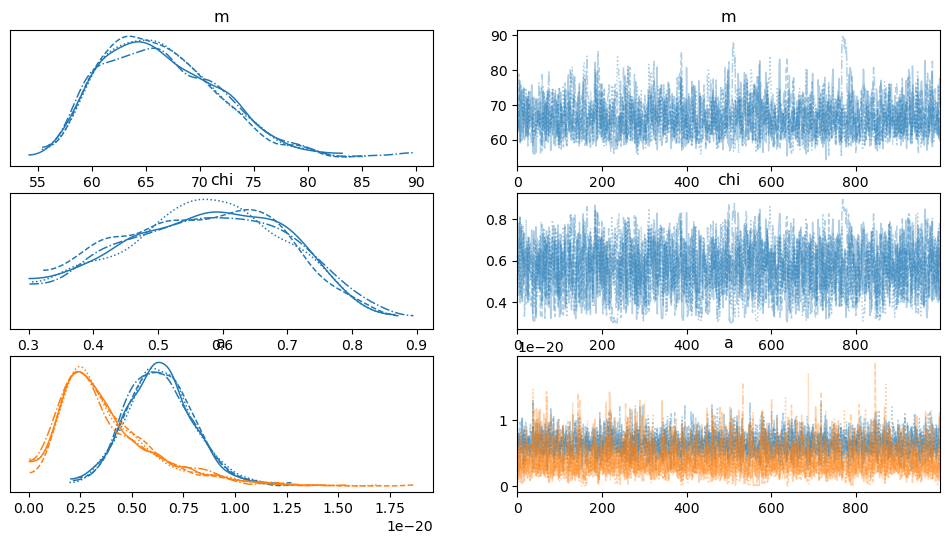

In [4]:
az.plot_trace(result, var_names=['m', 'chi', 'a']);

In [5]:
# this doesn't work with arviz InferenceData objects - find alternative if needed
# draw 500 samples from the posterior
result.get_parameter_dataframe(500, latex=True)

,$M / M_\odot$,$\chi$,$f_{220} / \mathrm{Hz}$,$f_{221} / \mathrm{Hz}$,$\gamma_{220} / \mathrm{Hz}$,$\gamma_{221} / \mathrm{Hz}$,$A_{220}$,$A_{221}$,$\phi_{220}$,$\phi_{221}$,$\theta_{220}$,$\theta_{221}$,$\epsilon_{220}$,$\epsilon_{221}$
1232,72.596169,0.662824,230.104614,224.527634,229.530563,694.483032,6.740555e-21,4.396365e-22,1.457859,1.754983,1.276818,-0.287509,-0.247593,0.388510
2627,64.280174,0.533250,237.937408,229.934982,268.790771,816.011230,2.653254e-21,2.416503e-21,-1.457919,0.732476,-1.567679,0.947943,-0.711276,-0.327235
534,67.833557,0.651511,244.152786,238.032150,246.674881,746.561951,3.562172e-21,8.543262e-21,-0.065393,1.125603,-2.411861,0.874067,-0.588438,-0.133561
1412,58.239643,0.330150,235.967239,224.592087,305.050110,931.289001,9.606443e-21,4.791043e-21,1.361491,-1.034577,1.385082,1.594965,-0.191381,-0.421799
752,58.833382,0.406656,242.382645,232.031723,299.579865,912.666321,6.845189e-21,5.422793e-21,-0.864053,0.793521,-1.911441,0.612651,-0.452504,-0.545945
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
857,60.883400,0.440416,238.351288,228.749481,288.238434,877.293701,5.634195e-21,2.167249e-21,1.393536,1.855564,1.521151,-0.723833,-0.255923,-0.428459
2177,65.430290,0.625764,248.396973,241.702209,257.953430,781.198730,4.529637e-21,5.211129e-21,-1.028709,1.486910,-1.759906,0.806691,-0.415410,-0.246208
3715,63.890984,0.493032,233.791809,225.254776,272.462158,828.069641,5.506121e-21,3.029047e-21,1.557356,1.722083,1.452988,0.534733,-0.380124,0.115501
2471,58.628273,0.423640,245.354980,235.176041,299.993896,913.497803,7.414025e-21,8.838535e-21,-1.059004,0.521760,-1.857001,0.998117,-0.344688,-0.316991


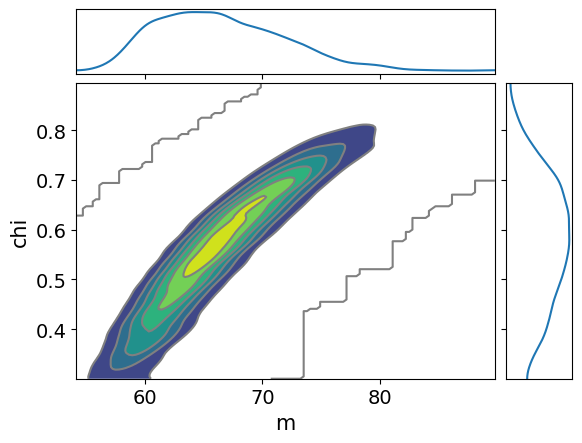

In [6]:
az.plot_pair(result, var_names=['m', 'chi'], marginals=True,
             kind='kde');

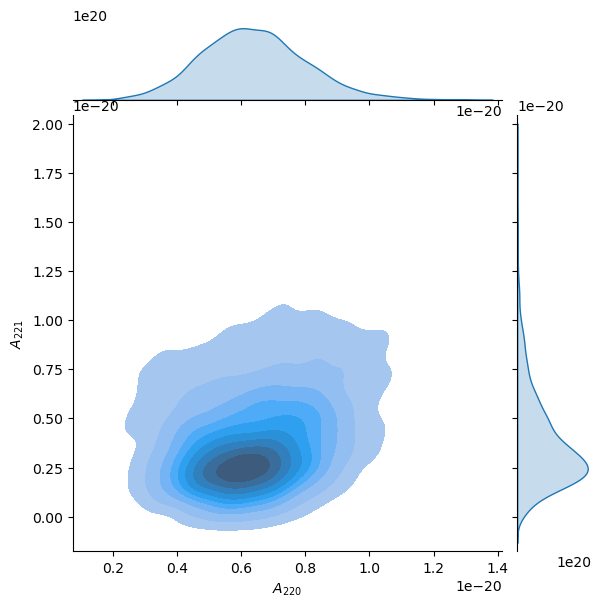

In [7]:
df = result.get_parameter_dataframe()
g = sns.jointplot(x=df['a_220'], y=df['a_221'], kind='kde', fill=True);
g.ax_joint.set_xlabel('$A_{220}$');
g.ax_joint.set_ylabel('$A_{221}$');

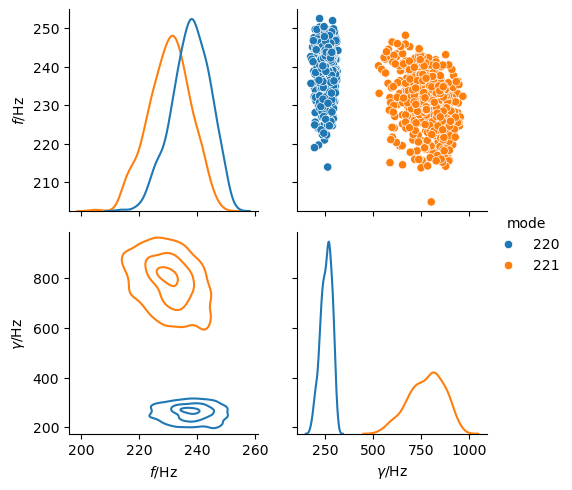

In [ ]:
df = result.get_mode_parameter_dataframe(500, latex=True)
key_map = result.get_parameter_key_map(modes=False)

pg = sns.PairGrid(df, vars=[key_map[k] for k in ['f', 'g']],
                  diag_sharey=False, hue='mode')
pg.map_diag(sns.kdeplot);
pg.map_upper(sns.scatterplot);
pg.map_lower(rd.utils.kdeplot, levels=[0.9, 0.5, 0.1]);
pg.add_legend();

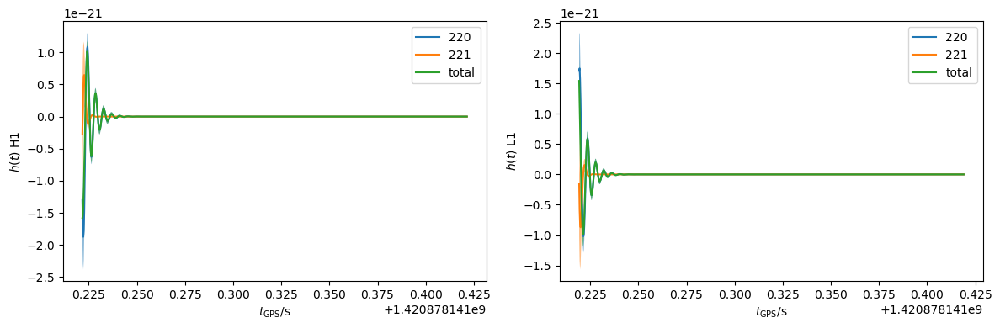

In [ ]:
fig, axs = plt.subplots(1, len(ifos), figsize=(12, 4))
axs = np.atleast_1d(axs)
for mode in result.modes:
    hdet_mode_cls = [result.get_strain_quantile(q, mode=mode) for q in [0.5, 0.05, 0.95]]
    for i, ax in zip(ifos, axs):
        m, l, h = [hcl[i] for hcl in hdet_mode_cls]
        ax.plot(m, label=mode.get_label())
        ax.fill_between(m.index, l, h, alpha=0.5)
    
hdet_cls = [result.get_strain_quantile(q) for q in [0.5, 0.05, 0.95]]    
for i, ax in zip(ifos, axs):
    m, l, h = [hcl[i] for hcl in hdet_cls]
        
    ax.plot(m, label='total')
    ax.fill_between(m.index, l, h, alpha=0.5)
    
    #ax.set_xlim(start_times[i]- 0.001,
    #            start_times[i] + 0.025)
    ax.set_xlabel(r'$t_\mathrm{GPS} / \mathrm{s}$')
    ax.set_ylabel(f'$h(t)$ {i}');
    ax.legend();
plt.tight_layout()

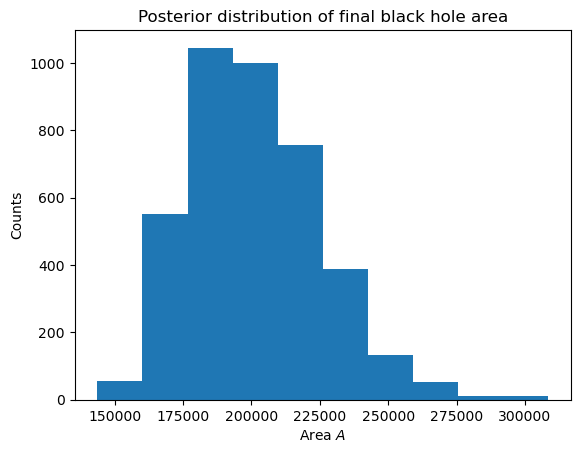

In [ ]:
m_post = np.array(result.posterior['m']).flatten()
chi_post = np.array(result.posterior['chi']).flatten()

area = 8*np.pi*m_post**2*(1+np.sqrt(1-chi_post**2))

plt.figure()
plt.hist(area)
plt.title('Posterior distribution of final black hole area')
plt.xlabel(r'Area $A$')
plt.ylabel('Counts')

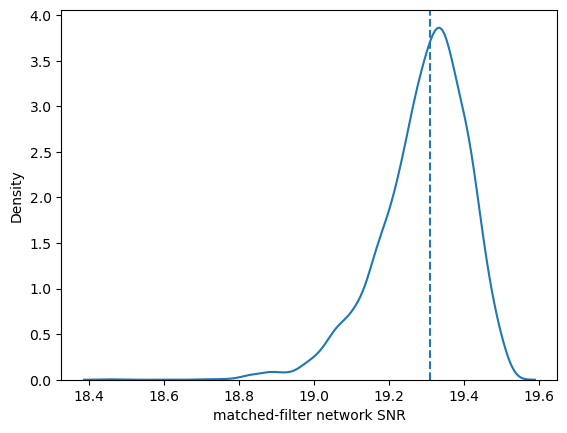

In [11]:
fig = plt.figure()
snrs = result.compute_posterior_snrs(optimal=False, network=True)
sns.kdeplot(snrs)
plt.axvline(np.median(snrs), ls='--')
plt.xlabel('matched-filter network SNR')
plt.show()

# Summary plots of all runs #

In [28]:
# Extract parameters from your configuration
num_modes = [1, 2]
start_offsets = [5, 6, 7, 8, 9, 10, 10.5, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]

# Configuration
FIT_DIR = Path("./fitresults")
VAR_NAMES = ['m', 'chi']

# Parse filenames - handles format like start_105 for 10.5
pattern = re.compile(r".*modes[_-]?(\d+).*start[_-]?(\d+).*\.nc$", re.IGNORECASE)
files = {}

for p in FIT_DIR.glob("*.nc"):
    m = pattern.match(p.name)
    if not m:
        continue
    modes = int(m.group(1))
    start_int = int(m.group(2))
    # Convert: 105 -> 10.5, 4 -> 4.0, etc.
    start = start_int / 10.0 if start_int >= 100 else float(start_int)
    files[(start, modes)] = p

if not files:
    raise FileNotFoundError(f"No matching result files found in {FIT_DIR}")

print(f"Found {len(files)} result files")

nrows = len(start_offsets)
ncols = len(num_modes)

Found 33 result files



Saved combined plot to fitresults_plots/corner_plots_grid.png


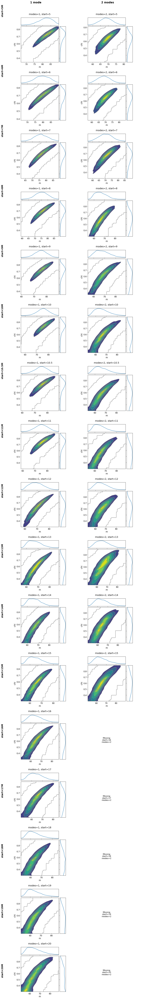

In [29]:
# CORNER PLOT
fig, axs = plt.subplots(nrows=nrows, ncols=ncols,
                        figsize=(6 * ncols, 5 * nrows))
axs = np.atleast_2d(axs)

for i, start in enumerate(start_offsets):
    for j, modes in enumerate(num_modes):
        ax = axs[i, j]
        key = (start, modes)
        
        if key not in files:
            ax.text(0.5, 0.5, f"Missing\nstart={start}\nmodes={modes}", 
                   ha='center', va='center', fontsize=12)
            ax.axis('off')
            continue

        path = files[key]
        
        try:
            res = Result.from_netcdf(path)
            
            # Create corner plot - az.plot_pair creates its own figure
            axes = az.plot_pair(
                res, 
                var_names=VAR_NAMES, 
                marginals=True,
                kind='kde',
                figsize=(5, 5)
            )
            
            # Get the figure that was just created
            temp_fig = plt.gcf()
            
            # Convert the plot to an image
            buf = BytesIO()
            temp_fig.savefig(buf, format='png', dpi=100, bbox_inches='tight')
            buf.seek(0)
            plt.close(temp_fig)  # Close to avoid displaying it separately
            
            # Display the image in the grid
            img = Image.open(buf)
            ax.imshow(np.array(img))
            ax.axis('off')
            ax.set_title(f"modes={modes}, start={start}", fontsize=14, pad=10)
            
        except Exception as e:
            ax.text(0.5, 0.5, f"Error\n{str(e)[:100]}", 
                   ha='center', va='center', fontsize=10, wrap=True)
            ax.axis('off')
            ax.set_title(f"modes={modes}, start={start}", fontsize=14, pad=10)
            print(f"Error for modes={modes}, start={start}: {e}")

# Add column labels
for j, modes in enumerate(num_modes):
    fig.text((j + 0.5) / ncols, 0.98, f"{modes} mode{'s' if modes > 1 else ''}", 
             ha='center', va='top', fontsize=16, weight='bold',
             transform=fig.transFigure)

# Add row labels
for i, start in enumerate(start_offsets):
    fig.text(0.01, 1 - (i + 0.5) / nrows, f"start={start}M", 
             ha='left', va='center', fontsize=14, weight='bold',
             transform=fig.transFigure, rotation=90)

plt.tight_layout(rect=[0.02, 0, 1, 0.97])
plt.savefig('fitresults_plots/corner_plots_grid.png', dpi=150, bbox_inches='tight')
print("\nSaved combined plot to fitresults_plots/corner_plots_grid.png")


Saved combined plot to fitresults_plots/amplitude_plots_grid.png


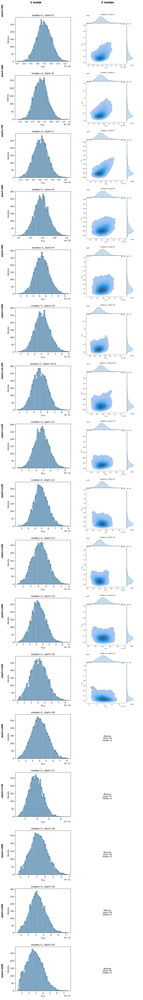

In [30]:
# AMPLITUDE PLOT
# Create main figure for the grid
fig, axs = plt.subplots(nrows=nrows, ncols=ncols,
                        figsize=(6 * ncols, 5 * nrows))
axs = np.atleast_2d(axs)

for i, start in enumerate(start_offsets):
    for j, modes in enumerate(num_modes):
        ax = axs[i, j]
        key = (start, modes)
        
        if key not in files:
            ax.text(0.5, 0.5, f"Missing\nstart={start}\nmodes={modes}", 
                   ha='center', va='center', fontsize=12)
            ax.axis('off')
            continue

        path = files[key]
        
        try:
            res = Result.from_netcdf(path)
            df = res.get_parameter_dataframe()
            
            if modes == 1:
                # For single mode, just plot the distribution of a_220
                temp_fig, temp_ax = plt.subplots(figsize=(5, 4))
                sns.histplot(df['a_220'], kde=True, ax=temp_ax)
                temp_ax.set_xlabel('$A_{220}$')
                temp_ax.set_ylabel('Density')
                temp_ax.set_title(f"modes={modes}, start={start}")
            else:
                # For multiple modes, create jointplot
                g = sns.jointplot(x=df['a_220'], y=df['a_221'], kind='kde', fill=True)
                g.ax_joint.set_xlabel('$A_{220}$')
                g.ax_joint.set_ylabel('$A_{221}$')
                g.fig.suptitle(f"modes={modes}, start={start}", y=1.02)
                temp_fig = g.fig
            
            # Convert the plot to an image
            buf = BytesIO()
            temp_fig.savefig(buf, format='png', dpi=100, bbox_inches='tight')
            buf.seek(0)
            plt.close(temp_fig)  # Close to avoid displaying it separately
            
            # Display the image in the grid
            img = Image.open(buf)
            ax.imshow(np.array(img))
            ax.axis('off')
            
        except Exception as e:
            ax.text(0.5, 0.5, f"Error\n{str(e)[:100]}", 
                   ha='center', va='center', fontsize=10, wrap=True)
            ax.axis('off')
            ax.set_title(f"modes={modes}, start={start}", fontsize=14, pad=10)
            print(f"Error for modes={modes}, start={start}: {e}")

# Add column labels
for j, modes in enumerate(num_modes):
    fig.text((j + 0.5) / ncols, 0.98, f"{modes} mode{'s' if modes > 1 else ''}", 
             ha='center', va='top', fontsize=16, weight='bold',
             transform=fig.transFigure)

# Add row labels
for i, start in enumerate(start_offsets):
    fig.text(0.01, 1 - (i + 0.5) / nrows, f"start={start}M", 
             ha='left', va='center', fontsize=14, weight='bold',
             transform=fig.transFigure, rotation=90)

plt.tight_layout(rect=[0.02, 0, 1, 0.97])
plt.savefig('fitresults_plots/amplitude_plots_grid.png', dpi=150, bbox_inches='tight')
print("\nSaved combined plot to fitresults_plots/amplitude_plots_grid.png")


Saved combined plot to fitresults_plots/mode_parameter_plots_grid.png


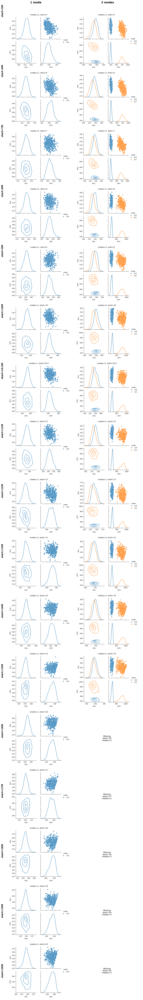

In [31]:
# FREQUENCY-DAMPING PLOT
# Create main figure for the grid
fig, axs = plt.subplots(nrows=nrows, ncols=ncols,
                        figsize=(6 * ncols, 5 * nrows))
axs = np.atleast_2d(axs)

for i, start in enumerate(start_offsets):
    for j, modes in enumerate(num_modes):
        ax = axs[i, j]
        key = (start, modes)
        
        if key not in files:
            ax.text(0.5, 0.5, f"Missing\nstart={start}\nmodes={modes}", 
                   ha='center', va='center', fontsize=12)
            ax.axis('off')
            continue

        path = files[key]
        
        try:
            res = Result.from_netcdf(path)
            df = res.get_mode_parameter_dataframe(500, latex=True)
            key_map = res.get_parameter_key_map(modes=False)
            
            # Create PairGrid
            pg = sns.PairGrid(df, vars=[key_map[k] for k in ['f', 'g']],
                             diag_sharey=False, hue='mode')
            pg.map_diag(sns.kdeplot)
            pg.map_upper(sns.scatterplot)
            pg.map_lower(rd.utils.kdeplot, levels=[0.9, 0.5, 0.1])
            pg.add_legend()
            pg.fig.suptitle(f"modes={modes}, start={start}", y=1.02)
            
            # Get the figure
            temp_fig = pg.fig
            
            # Convert the plot to an image
            buf = BytesIO()
            temp_fig.savefig(buf, format='png', dpi=100, bbox_inches='tight')
            buf.seek(0)
            plt.close(temp_fig)  # Close to avoid displaying it separately
            
            # Display the image in the grid
            img = Image.open(buf)
            ax.imshow(np.array(img))
            ax.axis('off')
            
        except Exception as e:
            ax.text(0.5, 0.5, f"Error\n{str(e)[:100]}", 
                   ha='center', va='center', fontsize=10, wrap=True)
            ax.axis('off')
            ax.set_title(f"modes={modes}, start={start}", fontsize=14, pad=10)
            print(f"Error for modes={modes}, start={start}: {e}")

# Add column labels
for j, modes in enumerate(num_modes):
    fig.text((j + 0.5) / ncols, 0.98, f"{modes} mode{'s' if modes > 1 else ''}", 
             ha='center', va='top', fontsize=16, weight='bold',
             transform=fig.transFigure)

# Add row labels
for i, start in enumerate(start_offsets):
    fig.text(0.01, 1 - (i + 0.5) / nrows, f"start={start}M", 
             ha='left', va='center', fontsize=14, weight='bold',
             transform=fig.transFigure, rotation=90)

plt.tight_layout(rect=[0.02, 0, 1, 0.97])
plt.savefig('fitresults_plots/mode_parameter_plots_grid.png', dpi=150, bbox_inches='tight')
print("\nSaved combined plot to fitresults_plots/mode_parameter_plots_grid.png")


Saved combined plot to fitresults_plots/strain_plots_grid.png


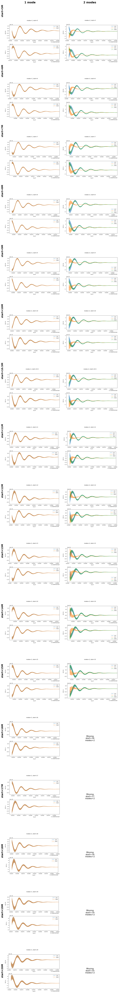

In [32]:
# STRAIN PLOT
# Create main figure for the grid
fig_main, axs_main = plt.subplots(nrows=nrows, ncols=ncols,
                                   figsize=(5 * ncols, 5 * nrows))
axs_main = np.atleast_2d(axs_main)

for i, start in enumerate(start_offsets):
    for j, modes in enumerate(num_modes):
        ax_main = axs_main[i, j]
        key = (start, modes)
        
        if key not in files:
            ax_main.text(0.5, 0.5, f"Missing\nstart={start}\nmodes={modes}", 
                        ha='center', va='center', fontsize=12)
            ax_main.axis('off')
            continue

        path = files[key]
        
        try:
            res = Result.from_netcdf(path)
            ifos = ['H1', 'L1']  # Define IFOs explicitly
            
            # Create strain plot - stack vertically instead of horizontally
            temp_fig, axs = plt.subplots(len(ifos), 1, figsize=(8, 6))
            axs = np.atleast_1d(axs)
            
            # Plot each mode
            for mode in res.modes:
                hdet_mode_cls = [res.get_strain_quantile(q, mode=mode) for q in [0.5, 0.05, 0.95]]
                for ifo, ax in zip(ifos, axs):
                    m, l, h = [hcl[ifo] for hcl in hdet_mode_cls]
                    ax.plot(m, label=mode.get_label())
                    ax.fill_between(m.index, l, h, alpha=0.5)
            
            # Plot total strain
            hdet_cls = [res.get_strain_quantile(q) for q in [0.5, 0.05, 0.95]]    
            for ifo, ax in zip(ifos, axs):
                m, l, h = [hcl[ifo] for hcl in hdet_cls]
                
                ax.plot(m, label='total')
                ax.fill_between(m.index, l, h, alpha=0.5)
                
                # Set xlim based on the time index
                t_start = m.index.min()
                ax.set_xlim(t_start - 0.001, t_start + 0.02)
                
                ax.set_xlabel(r'$t_\mathrm{GPS} / \mathrm{s}$')
                ax.set_ylabel(f'$h(t)$ {ifo}')
                ax.legend()
            
            temp_fig.suptitle(f"modes={modes}, start={start}", y=1.02)
            temp_fig.tight_layout()
            
            # Convert the plot to an image
            buf = BytesIO()
            temp_fig.savefig(buf, format='png', dpi=100, bbox_inches='tight')
            buf.seek(0)
            plt.close(temp_fig)  # Close to avoid displaying it separately
            
            # Display the image in the grid
            img = Image.open(buf)
            ax_main.imshow(np.array(img))
            ax_main.axis('off')
            
        except Exception as e:
            ax_main.text(0.5, 0.5, f"Error\n{str(e)[:150]}", 
                        ha='center', va='center', fontsize=10, wrap=True)
            ax_main.axis('off')
            ax_main.set_title(f"modes={modes}, start={start}", fontsize=14, pad=10)
            print(f"Error for modes={modes}, start={start}: {e}")

# Add column labels
for j, modes in enumerate(num_modes):
    fig_main.text((j + 0.5) / ncols, 0.98, f"{modes} mode{'s' if modes > 1 else ''}", 
                  ha='center', va='top', fontsize=16, weight='bold',
                  transform=fig_main.transFigure)

# Add row labels
for i, start in enumerate(start_offsets):
    fig_main.text(0.01, 1 - (i + 0.5) / nrows, f"start={start}M", 
                  ha='left', va='center', fontsize=14, weight='bold',
                  transform=fig_main.transFigure, rotation=90)

plt.tight_layout(rect=[0.02, 0, 1, 0.97])
plt.savefig('fitresults_plots/strain_plots_grid.png', dpi=150, bbox_inches='tight')
print("\nSaved combined plot to fitresults_plots/strain_plots_grid.png")


Saved combined plot to fitresults_plots/area_plots_grid.png


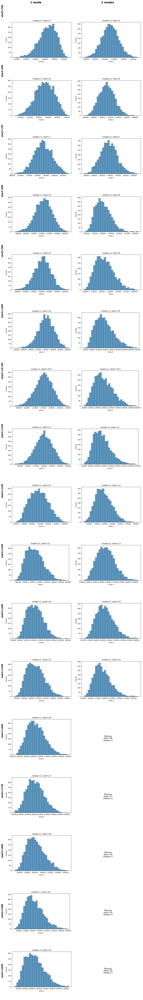

In [33]:
# AREA PLOT
# Create main figure for the grid
fig_main, axs_main = plt.subplots(nrows=nrows, ncols=ncols,
                                   figsize=(6 * ncols, 5 * nrows))
axs_main = np.atleast_2d(axs_main)

for i, start in enumerate(start_offsets):
    for j, modes in enumerate(num_modes):
        ax_main = axs_main[i, j]
        key = (start, modes)
        
        if key not in files:
            ax_main.text(0.5, 0.5, f"Missing\nstart={start}\nmodes={modes}", 
                        ha='center', va='center', fontsize=12)
            ax_main.axis('off')
            continue

        path = files[key]
        
        try:
            res = Result.from_netcdf(path)
            
            # Extract mass and spin posteriors
            m_post = np.array(res.posterior['m']).flatten()
            chi_post = np.array(res.posterior['chi']).flatten()
            
            # Calculate area
            area = 8*np.pi*m_post**2*(1+np.sqrt(1-chi_post**2))
            
            # Create histogram
            temp_fig, temp_ax = plt.subplots(figsize=(6, 4))
            temp_ax.hist(area, bins=30, edgecolor='black', alpha=0.7)
            temp_ax.set_title(f'modes={modes}, start={start}')
            temp_ax.set_xlabel(r'Area $A$')
            temp_ax.set_ylabel('Counts')
            temp_fig.tight_layout()
            
            # Convert the plot to an image
            buf = BytesIO()
            temp_fig.savefig(buf, format='png', dpi=100, bbox_inches='tight')
            buf.seek(0)
            plt.close(temp_fig)  # Close to avoid displaying it separately
            
            # Display the image in the grid
            img = Image.open(buf)
            ax_main.imshow(np.array(img))
            ax_main.axis('off')
            
        except Exception as e:
            ax_main.text(0.5, 0.5, f"Error\n{str(e)[:150]}", 
                        ha='center', va='center', fontsize=10, wrap=True)
            ax_main.axis('off')
            ax_main.set_title(f"modes={modes}, start={start}", fontsize=14, pad=10)
            print(f"Error for modes={modes}, start={start}: {e}")

# Add column labels
for j, modes in enumerate(num_modes):
    fig_main.text((j + 0.5) / ncols, 0.98, f"{modes} mode{'s' if modes > 1 else ''}", 
                  ha='center', va='top', fontsize=16, weight='bold',
                  transform=fig_main.transFigure)

# Add row labels
for i, start in enumerate(start_offsets):
    fig_main.text(0.01, 1 - (i + 0.5) / nrows, f"start={start}M", 
                  ha='left', va='center', fontsize=14, weight='bold',
                  transform=fig_main.transFigure, rotation=90)

plt.tight_layout(rect=[0.02, 0, 1, 0.97])
plt.savefig('fitresults_plots/area_plots_grid.png', dpi=150, bbox_inches='tight')
print("\nSaved combined plot to fitresults_plots/area_plots_grid.png")


Saved plot to fitresults_plots/amplitude_vs_start_time.png


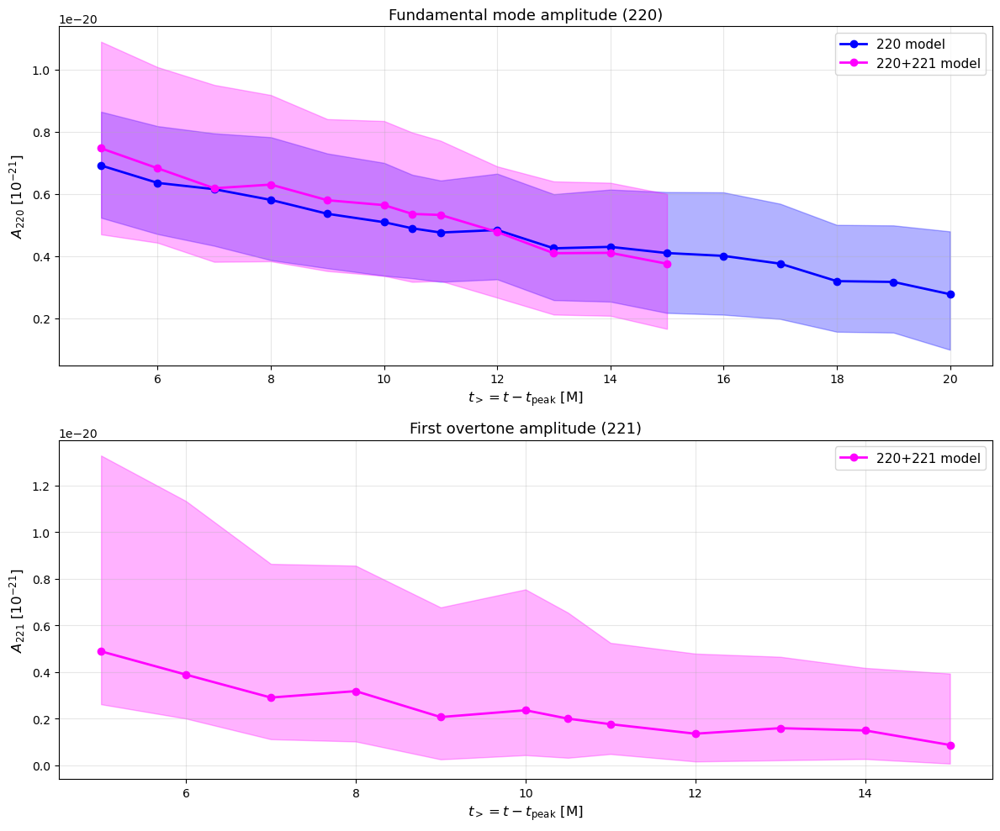

In [34]:
# Create figure with two subplots
fig, axs = plt.subplots(2, 1, figsize=(12, 10))

colors = {1: 'blue', 2: 'magenta'}
labels = {1: '220 model', 2: '220+221 model'}

# Collect data for plotting
data_1mode = {'starts': [], 'a220_med': [], 'a220_lo': [], 'a220_hi': []}
data_2mode = {'starts': [], 'a220_med': [], 'a220_lo': [], 'a220_hi': [],
              'a221_med': [], 'a221_lo': [], 'a221_hi': []}

for mode_count in num_modes:
    
    for start in sorted(start_offsets):
        key = (start, mode_count)
        if key not in files:
            continue
        
        try:
            res = Result.from_netcdf(files[key])
            
            # Check what modes are available
            available_modes = list(res.posterior['a'].coords['mode'].values)
            
            # Get amplitude for first mode (220)
            if len(available_modes) >= 1:
                a_220 = np.array(res.posterior['a'].isel(mode=0)).flatten()
                
                if mode_count == 1:
                    data_1mode['starts'].append(start)
                    data_1mode['a220_med'].append(np.median(a_220))
                    data_1mode['a220_lo'].append(np.percentile(a_220, 5))
                    data_1mode['a220_hi'].append(np.percentile(a_220, 95))
                else:
                    data_2mode['starts'].append(start)
                    data_2mode['a220_med'].append(np.median(a_220))
                    data_2mode['a220_lo'].append(np.percentile(a_220, 5))
                    data_2mode['a220_hi'].append(np.percentile(a_220, 95))
            
            # Get amplitude for second mode (221) if available
            if mode_count == 2 and len(available_modes) >= 2:
                a_221 = np.array(res.posterior['a'].isel(mode=1)).flatten()
                data_2mode['a221_med'].append(np.median(a_221))
                data_2mode['a221_lo'].append(np.percentile(a_221, 5))
                data_2mode['a221_hi'].append(np.percentile(a_221, 95))
            
        except Exception as e:
            print(f"Error processing modes={mode_count}, start={start}: {e}")
            continue

# Plot top panel: A_220 for both 1-mode and 2-mode
ax = axs[0]
if data_1mode['starts']:
    starts_1 = np.array(data_1mode['starts'])
    ax.plot(starts_1, data_1mode['a220_med'], 'o-', color=colors[1], 
            label=labels[1], linewidth=2, markersize=6)
    ax.fill_between(starts_1, data_1mode['a220_lo'], data_1mode['a220_hi'], 
                    alpha=0.3, color=colors[1])

if data_2mode['starts']:
    starts_2 = np.array(data_2mode['starts'])
    ax.plot(starts_2, data_2mode['a220_med'], 'o-', color=colors[2], 
            label=labels[2], linewidth=2, markersize=6)
    ax.fill_between(starts_2, data_2mode['a220_lo'], data_2mode['a220_hi'], 
                    alpha=0.3, color=colors[2])

ax.set_xlabel(r'$t_> = t - t_{\mathrm{peak}}$ [M]', fontsize=12)
ax.set_ylabel(r'$A_{220}$ [$10^{-21}$]', fontsize=12)
ax.legend(loc='upper right', fontsize=11)
ax.grid(True, alpha=0.3)
ax.set_title("Fundamental mode amplitude (220)", fontsize=13)

# Plot bottom panel: A_221 for 2-mode only
ax = axs[1]
if data_2mode['starts'] and data_2mode['a221_med']:
    ax.plot(starts_2, data_2mode['a221_med'], 'o-', color=colors[2], 
            label=labels[2], linewidth=2, markersize=6)
    ax.fill_between(starts_2, data_2mode['a221_lo'], data_2mode['a221_hi'], 
                    alpha=0.3, color=colors[2])

ax.set_xlabel(r'$t_> = t - t_{\mathrm{peak}}$ [M]', fontsize=12)
ax.set_ylabel(r'$A_{221}$ [$10^{-21}$]', fontsize=12)
ax.legend(loc='upper right', fontsize=11)
ax.grid(True, alpha=0.3)
ax.set_title("First overtone amplitude (221)", fontsize=13)

plt.tight_layout()
plt.savefig('fitresults_plots/amplitude_vs_start_time.png', dpi=150, bbox_inches='tight')
print("\nSaved plot to fitresults_plots/amplitude_vs_start_time.png")
plt.show()